In [2]:
import torch, sys, os, random, json
import matplotlib.pyplot as plt
import numpy as np

from scipy.ndimage import zoom
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from neuralop.models import TFNO
from neuralop.utils import count_params
from scipy.io import savemat, loadmat
from tqdm import tqdm

%matplotlib widget

In [3]:
class PairDataset(Dataset):
    def __init__(self, data_path, subset_idx_list):
        self.tof_list = []
        self.ss_list = []
        self.subset_idx_list = subset_idx_list

        for i in range(1, 201):
            tof = loadmat(f'{data_path}/tof_noise1.0/grf{i}_tof.mat')
            self.tof_list.append(torch.from_numpy(tof['tof_array'].astype(float)))
            ss = loadmat(f'{data_path}/sound_speed/grf{i}_sound_speed.mat')
            self.ss_list.append(torch.from_numpy(ss['sound_speed'].astype(float)))
        
        self.tof_bulk = torch.stack(self.tof_list, 0)
        self.ss_bulk = torch.stack(self.ss_list, 0)
        self.tof_min, self.tof_max = self.tof_bulk.min(), self.tof_bulk.max()
        self.ss_min, self.ss_max = self.ss_bulk.min(), self.ss_bulk.max()
        
    def __len__(self):
        return len(self.subset_idx_list)
        
    def __getitem__(self, idx):
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        tof = torch.zeros((3, *self.tof_list[self.subset_idx_list[idx]].shape))
        xx = torch.linspace(0, self.tof_list[self.subset_idx_list[idx]].shape[0]-1, self.tof_list[self.subset_idx_list[idx]].shape[0])/self.tof_list[self.subset_idx_list[idx]].shape[0]
        yy = torch.linspace(0, self.tof_list[self.subset_idx_list[idx]].shape[1]-1, self.tof_list[self.subset_idx_list[idx]].shape[1])/self.tof_list[self.subset_idx_list[idx]].shape[1]
        grid_xx, grid_yy = torch.meshgrid(xx, yy, indexing='ij')
        tof[0] = (self.tof_list[self.subset_idx_list[idx]]-self.tof_min)/(self.tof_max-self.tof_min)
        tof[1] = grid_xx
        tof[2] = grid_yy
        ss = ((self.ss_list[self.subset_idx_list[idx]]-self.ss_min)/(self.ss_max-self.ss_min)).unsqueeze(0)#.unsqueeze(0)

        sample = {  'id'       : self.subset_idx_list[idx],
                    'input'    : tof.float(),
                    'output'   : ss.float()}
        return sample

In [4]:
mode='gpu'

if mode=='gpu':
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # after switch device, you need restart the kernel
    torch.cuda.set_device(1)
    torch.set_default_tensor_type('torch.cuda.FloatTensor')
else:
    device = torch.device('cpu')
    torch.set_default_dtype(torch.float32)

    
output_dir = f'/home/sci/hdai/Projects/UltrasoundTfno/Models/tfno_mode64_hc64_pc64_grf128_200_noise1.0'
if not os.path.isdir(output_dir):
    os.mkdir(output_dir)

## Training

In [7]:
save_model = True
resume = False
n_epochs = 10001
start_epoch_num = 1201
learning_rate = 1e-3

model = TFNO(n_modes=(64,64), hidden_channels=64, projection_channels=64, factorization='tucker', rank=0.42)
model = model.to(device)
n_params = count_params(model)
print(f'\nOur model has {n_params} parameters.')
print('\n### MODEL ###\n', model)

if resume:
    checkpoint = torch.load(f'{output_dir}/epoch_{start_epoch_num-1}_checkpoints.pth.tar')
    model.load_state_dict(checkpoint['model_state_dict'])
    with open(f'{output_dir}/training_subset_id_list.json', "rb") as fp:
        training_subset_id_list = json.load(fp)
    with open(f'{output_dir}/testing_subset_id_list.json', "rb") as fp:
        testing_subset_id_list = json.load(fp)
else:
    training_subset_id_list = random.sample(range(200),160)
    testing_subset_id_list = [item for item in range(200) if item not in training_subset_id_list]
    with open(f'{output_dir}/training_subset_id_list.json', "w") as fp:
        json.dump(training_subset_id_list, fp)
    with open(f'{output_dir}/testing_subset_id_list.json', "w") as fp:
        json.dump(testing_subset_id_list, fp)
        
data_path = '/home/sci/hdai/Projects/Dataset/Ultrasound/GRF/mats'
training_dataset = PairDataset(data_path, training_subset_id_list)
training_dataloader = DataLoader(training_dataset, batch_size=len(training_subset_id_list), shuffle=False, num_workers=0)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)
criterion = torch.nn.MSELoss()


Our model has 28268481 parameters.

### MODEL ###
 TFNO(
  (convs): FactorizedSpectralConv(
    (weight): ModuleList(
      (0): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (1): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (2): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (3): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (4): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (5): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (6): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
      (7): ComplexTuckerTensor(shape=(64, 64, 32, 32), rank=(51, 51, 26, 26))
    )
  )
  (fno_skips): ModuleList(
    (0): SoftGating()
    (1): SoftGating()
    (2): SoftGating()
    (3): SoftGating()
  )
  (lifting): Lifting(
    (fc): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (projection): Projection(
    (fc1): Conv

In [ ]:
log_test_interval = 100
model.train()

for epoch in tqdm(range(n_epochs)):
    epoch_loss = 0
    for i, sample in enumerate(training_dataloader):
        x, y_true = sample['input'].to(device), sample['output'].to(device)
        y_pred = model(x)
        
        optimizer.zero_grad(set_to_none=True)
        loss = criterion(y_pred, y_true)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    scheduler.step(epoch_loss)

    if epoch%log_test_interval==0: 
        print(f'epoch {epoch} MSELoss: {epoch_loss}')
        if save_model:
            torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss,
            }, f'{output_dir}/epoch_{epoch}_checkpoints.pth.tar')

  0%|                                                                                         | 0/10001 [00:00<?, ?it/s]

epoch 0 MSELoss: 0.3177255094051361


  1%|▊                                                                            | 100/10001 [01:00<1:36:46,  1.71it/s]

epoch 100 MSELoss: 0.03441296145319939


  2%|█▌                                                                           | 200/10001 [02:01<1:36:21,  1.70it/s]

epoch 200 MSELoss: 0.034062325954437256


  3%|██▎                                                                          | 300/10001 [03:02<1:35:12,  1.70it/s]

epoch 300 MSELoss: 0.03357534483075142


  4%|███                                                                          | 400/10001 [04:03<1:33:29,  1.71it/s]

epoch 400 MSELoss: 0.03314949944615364


  5%|███▊                                                                         | 500/10001 [05:04<1:32:52,  1.71it/s]

epoch 500 MSELoss: 0.032615046948194504


  6%|████▌                                                                        | 600/10001 [06:05<1:32:19,  1.70it/s]

epoch 600 MSELoss: 0.03220702335238457


  6%|████▊                                                                        | 632/10001 [06:26<1:32:13,  1.69it/s]

## Inference

In [6]:
epoch = 10000
checkpoint = torch.load(f'{output_dir}/epoch_{epoch}_checkpoints.pth.tar')
model = TFNO(n_modes=(64,64), hidden_channels=64, projection_channels=64, factorization='tucker', rank=0.42)
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)

### Test samples

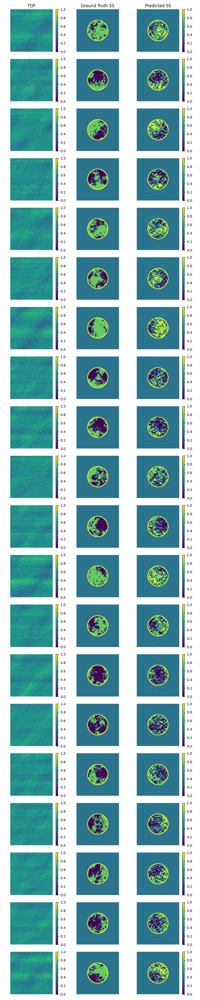

In [7]:
out_list = []
sample_num = 20

testing_dataset = PairDataset(data_path, testing_subset_id_list)
testing_dataloader = DataLoader(testing_dataset, batch_size=len(testing_subset_id_list), shuffle=False, num_workers=0)
test_samples = testing_dataloader.dataset

fig = plt.figure(figsize=(8, sample_num*2))
    
for index in range(sample_num):
    data = test_samples[index]
    x = data['input'].to(device)
    y = data['output'].to(device)
    out = model(x.unsqueeze(0))

    ax1 = fig.add_subplot(sample_num, 3, index*3 + 1)
    im1 = ax1.imshow(x[0].to('cpu'), cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax1.set_title('TOF')
    plt.colorbar(im1, ax=ax1)
    plt.axis('off')

    ax2 = fig.add_subplot(sample_num, 3, index*3 + 2)
    im2 = ax2.imshow(y.to('cpu').squeeze(), cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax2.set_title('Ground Truth SS')
#     plt.colorbar(im2, ax=ax2)
    plt.axis('off')

    ax3 = fig.add_subplot(sample_num, 3, index*3 + 3)
    im3 = ax3.imshow(out.to('cpu').squeeze().detach().numpy(), cmap='viridis', vmin=0, vmax=1)
    out_list.append(out.to('cpu').squeeze().detach().numpy())
    if index == 0: 
        ax3.set_title('Predicted SS')
    plt.colorbar(im3, ax=ax3)
    plt.axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/test_{epoch}.png', dpi=300)
plt.savefig(f'{output_dir}/test_{epoch}.pdf', dpi=300)

### Train samples

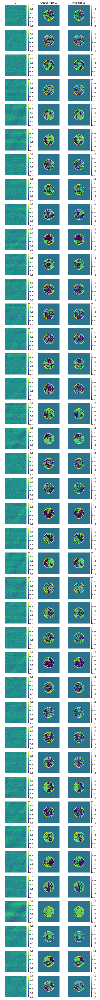

In [8]:
out_list = []
sample_num = 40

training_dataset = PairDataset(data_path, training_subset_id_list)
training_dataloader = DataLoader(training_dataset, batch_size=len(training_subset_id_list), shuffle=False, num_workers=0)
train_samples = training_dataloader.dataset

fig = plt.figure(figsize=(8, sample_num*2))
    
for index in range(sample_num):
    data = train_samples[index]
    x = data['input'].to(device)
    y = data['output'].to(device)
    out = model(x.unsqueeze(0))

    ax1 = fig.add_subplot(sample_num, 3, index*3 + 1)
    im1 = ax1.imshow(x[0].to('cpu'), cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax1.set_title('TOF')
    plt.colorbar(im1, ax=ax1)
    plt.axis('off')

    ax2 = fig.add_subplot(sample_num, 3, index*3 + 2)
    im2 = ax2.imshow(y.to('cpu').squeeze(), cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax2.set_title('Ground Truth SS')
    plt.axis('off')

    ax3 = fig.add_subplot(sample_num, 3, index*3 + 3)
    im3 = ax3.imshow(out.to('cpu').squeeze().detach().numpy(), cmap='viridis', vmin=0, vmax=1)
    out_list.append(out.to('cpu').squeeze().detach().numpy())
    if index == 0: 
        ax3.set_title('Predicted SS')
    plt.colorbar(im3, ax=ax3)
    plt.axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/train_{epoch}.png', dpi=300)
plt.savefig(f'{output_dir}/train_{epoch}.pdf', dpi=300)

### Paper figure

In [ ]:
colormap = 'viridis'
circle1 = plt.Circle((32, 32), 24, color='r', fill=False, linestyle='--')
circle2 = plt.Circle((32, 32), 24, color='r', fill=False, linestyle='--')
fig = plt.figure(figsize=(6, 4))
    
'''training sample'''
data = train_samples[38]
x = data['input'].to(device)
y = data['output'].to(device)
#     x[0] += torch.randn(64, 64).cuda()*np.sqrt(sigma)
out = model(x.unsqueeze(0))

ax1 = fig.add_subplot(2, 3, 1)
im1 = ax1.imshow(x[0].to('cpu'), cmap=colormap, vmin=0, vmax=1)
ax1.set_title('TOF', fontsize=12)
# plt.colorbar(im1, ax=ax1)
plt.ylabel('Training', fontsize=12)   
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(2, 3, 2)
im2 = ax2.imshow(y.to('cpu').squeeze(), cmap=colormap, vmin=0, vmax=1)
ax2.add_patch(circle1)
ax2.set_title('Ground Truth SS', fontsize=12)
# plt.colorbar(im2, ax=ax2)
plt.axis('off')

ax3 = fig.add_subplot(2, 3, 3)
im3 = ax3.imshow(out.to('cpu').squeeze().detach().numpy(), cmap=colormap, vmin=0, vmax=1)
ax3.set_title('Predicted SS', fontsize=12)
# plt.colorbar(im3, ax=ax3)
plt.axis('off')

'''testing sample'''
data = test_samples[4]
x = data['input'].to(device)
y = data['output'].to(device)
out = model(x.unsqueeze(0))

ax4 = fig.add_subplot(2, 3, 4)
im4 = ax4.imshow(x[0].to('cpu'), cmap=colormap, vmin=0, vmax=1)
# plt.colorbar(im4, ax=ax4)
plt.ylabel('Testing', fontsize=12)      
ax4.set_xticks([])
ax4.set_yticks([])

ax5 = fig.add_subplot(2, 3, 5)
im5 = ax5.imshow(y.to('cpu').squeeze(), cmap=colormap, vmin=0, vmax=1)
ax5.add_patch(circle2)
# plt.colorbar(im5, ax=ax5)
plt.axis('off')

ax6 = fig.add_subplot(2, 3, 6)
im6 = ax6.imshow(out.to('cpu').squeeze().detach().numpy(), cmap=colormap, vmin=0, vmax=1)
# plt.colorbar(im6, ax=ax6)
plt.axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/paper_plot.pdf', dpi=300)

### Loss trend

In [24]:
training_loss = []
testing_loss = []
data_path = '/home/sci/hdai/Projects/Dataset/Ultrasound/GRF/mats'
with open(f'{output_dir}/training_subset_id_list.json', "rb") as fp:
    training_subset_id_list = json.load(fp)
with open(f'{output_dir}/testing_subset_id_list.json', "rb") as fp:
    testing_subset_id_list = json.load(fp)

for epoch in tqdm(range(0,10001,100)):
    torch.cuda.empty_cache()
    checkpoint = torch.load(f'{output_dir}/epoch_{epoch}_checkpoints.pth.tar')
    model = TFNO(n_modes=(64,64), hidden_channels=64, projection_channels=64, factorization='tucker', rank=0.42)
    model.load_state_dict(checkpoint['model_state_dict'])
    model = model.to(device)
    model.eval()
    
    training_dataset = PairDataset(data_path, training_subset_id_list)
    training_dataloader = DataLoader(training_dataset, batch_size=len(training_subset_id_list), shuffle=False, num_workers=0)
    train_samples = training_dataloader.dataset
    training_total_loss = 0
    
    with torch.no_grad():
        for i, sample in enumerate(training_dataloader):
            x, y_true = sample['input'].to(device), sample['output'].to(device)
            y_pred = model(x)

        training_loss.append(torch.sum((y_true.squeeze()-y_pred.squeeze())**2).item()/len(training_subset_id_list))
    
    testing_dataset = PairDataset(data_path, testing_subset_id_list)
    testing_dataloader = DataLoader(testing_dataset, batch_size=len(testing_subset_id_list), shuffle=False, num_workers=0)
    test_samples = testing_dataloader.dataset
    testing_total_loss = 0

    with torch.no_grad():
        for i, sample in enumerate(testing_dataloader):
            x, y_true = sample['input'].to(device), sample['output'].to(device)
            y_pred = model(x)

        testing_loss.append(torch.sum((y_true.squeeze()-y_pred.squeeze())**2).item()/len(testing_subset_id_list))

100%|█████████████████████████████████████████████████████████████████████████████████| 101/101 [05:13<00:00,  3.10s/it]


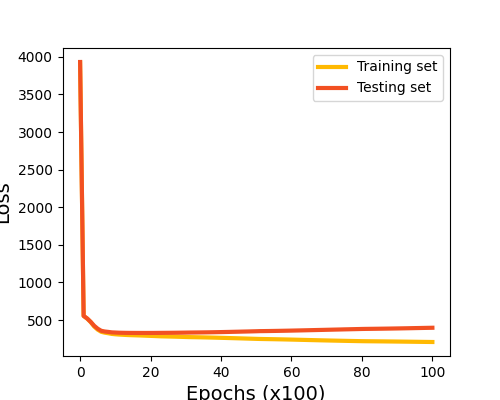

In [25]:
plt.figure(figsize=(5,4))
plt.xlabel('Epochs (x100)', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.plot(training_loss,color='#ffb901',linewidth=3,label='Training set')
plt.plot(testing_loss,color='#f25022',linewidth=3,label='Testing set')
plt.legend()

plt.savefig(f'{output_dir}/loss_trend.pdf', bbox_inches='tight', dpi=300)